# Explorotary Data Analysis for Credit Card Default Payment Algorithms



In [66]:
import jovian
import opendatasets as od
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline

In [67]:
# Let's load the training dataset using pandas library
train_df = pd.read_csv('GiveMeSomeCredit/cs-training.csv')
train_df.head() 

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0


In [68]:
train_df.columns

Index(['Unnamed: 0', 'SeriousDlqin2yrs',
       'RevolvingUtilizationOfUnsecuredLines', 'age',
       'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome',
       'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
       'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse',
       'NumberOfDependents'],
      dtype='object')

In [69]:
# As we have seen above both in train_df and test_df we have columns Unnamed:0.Let's rename it to Id.
data = [train_df]
for df in data:
    df.drop(columns={'Unnamed: 0'},inplace=True)

In [71]:
train_df.isnull().sum()

SeriousDlqin2yrs                            0
RevolvingUtilizationOfUnsecuredLines        0
age                                         0
NumberOfTime30-59DaysPastDueNotWorse        0
DebtRatio                                   0
MonthlyIncome                           29731
NumberOfOpenCreditLinesAndLoans             0
NumberOfTimes90DaysLate                     0
NumberRealEstateLoansOrLines                0
NumberOfTime60-89DaysPastDueNotWorse        0
NumberOfDependents                       3924
dtype: int64

<Axes: >

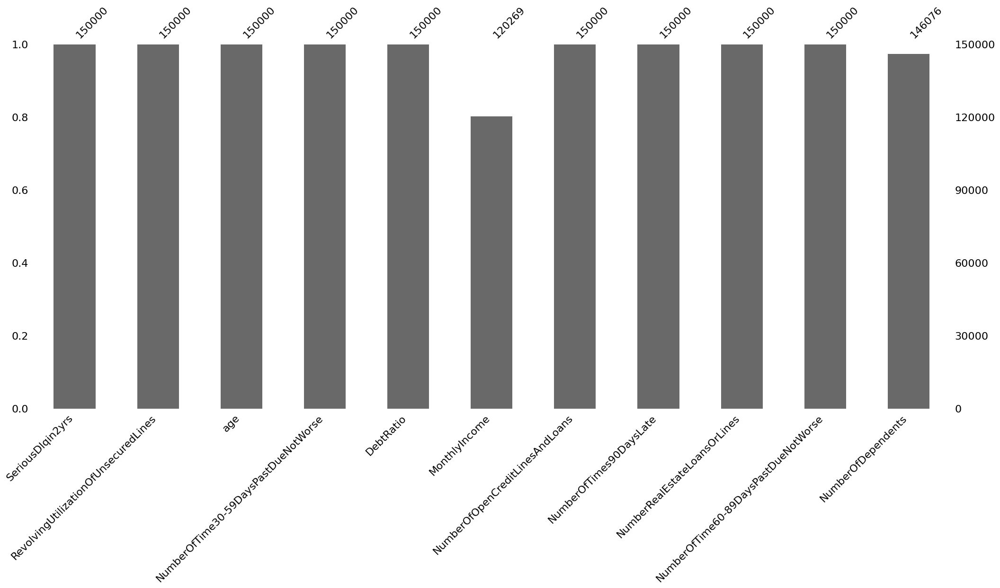

In [72]:
msno.bar(train_df)

### Analysis

`MonthlyIncome` has the most of missing values and the following is `NumberOfDependents`. We'll see more analysis later on in this notebook.

## Exploring Variables

## `SeriousDlqin2yrs`

`SeriousDlqin2yrs` is our target variable. Regarding the data description file, the variable refers to **a person who experienced delinquency or not in the past 90 days**, with the value of 1 flagging a defaulting event, 0 otherwise. 

**NOTE:**

Although the duration of the variable was defined for 2 years, a person who did not pay back to what is borrowed over 90 days would be flagged regarding the defintion.

In [73]:
train_df['SeriousDlqin2yrs'].unique()

array([1, 0], dtype=int64)

In [74]:
train_df['SeriousDlqin2yrs'].value_counts()

SeriousDlqin2yrs
0    139974
1     10026
Name: count, dtype: int64

In [75]:
counts = train_df['SeriousDlqin2yrs'].value_counts()


fig = go.Figure()

# Dark mode layout
fig.update_layout(
    template="plotly_dark",  # Set the dark mode template
    title="Distribution of SeriousDlqin2yrs",
    xaxis_title="SeriousDlqin2yrs",
    yaxis_title="Count",
)


fig.add_trace(
    go.Bar(
        x=counts.index,
        y=counts.values,
        marker_color=px.colors.qualitative.Plotly[0],  # Pick a color for the bars
        text=counts.values,
        textposition="outside",
    )
)


fig.show()


![](https://i.imgur.com/lfmRf08.png)

## `MonthlyIncome`

In [76]:
train_df['MonthlyIncome']

0          9120.0
1          2600.0
2          3042.0
3          3300.0
4         63588.0
           ...   
149995     2100.0
149996     5584.0
149997        NaN
149998     5716.0
149999     8158.0
Name: MonthlyIncome, Length: 150000, dtype: float64

In [83]:
train_df['MonthlyIncome'].describe()

count    1.202690e+05
mean     6.670221e+03
std      1.438467e+04
min      0.000000e+00
25%      3.400000e+03
50%      5.400000e+03
75%      8.249000e+03
max      3.008750e+06
Name: MonthlyIncome, dtype: float64

In [77]:

data = {
    'SeriousDlqin2yrs': df['SeriousDlqin2yrs'].tolist(),
    'MonthlyIncome': df['MonthlyIncome'].tolist()
}

df = pd.DataFrame(data)

# Value counts of the target variable
target_value_counts = df['SeriousDlqin2yrs'].value_counts()

fig = px.bar(
    x=target_value_counts.index,
    y=target_value_counts.values,
    labels={'x': 'Default Status', 'y': 'Count'},
    title='Distribution of Default Status'
)

# Histogram for MonthlyIncome
histogram = px.histogram(
    df,
    x='MonthlyIncome',
    nbins=10,  # Number of bins for the histogram
    title='Distribution of Monthly Income'
)


fig.show()
histogram.show()


![Distribution Of Default Status](https://i.imgur.com/qIYLHbP.png)
![Distribution Of Monthly Income](https://i.imgur.com/Ob3A7MH.png)

## `Revolving Utilization of Unsecured Lines`


Revolving utilization measures the total balance on credit cards and personal lines of credit users are currently using. But in this dataset, the amount of revolving credit limits did not include the real estate and the installment debt like car loans.

when a person is approved for a credit card, she or he is given a credit limit. Let's say Mary has a credit card with a limit of $1,000 and she use it to buy $200 worth of a ticket for a music concert in London. Right after the payment, she now has a $200 balance and an $800 remaining credit limit. However, the next day is Mary's pay day and she decides to pay $200 back. Mary would gain $1,000 of open credit again. 

`RevolvingUtilizationOfUnsecuredLines` is the debt or unsecured loan. (It'd be easy to understand the term **unsecured** from the perspectives of lenders.)

In other words,	if a person didn’t pay borrowed money back as promised and there won’t be any loss of assets except bad credits, because the person didn’t give any assets as custody to borrow money.


In [78]:
train_df.columns

Index(['SeriousDlqin2yrs', 'RevolvingUtilizationOfUnsecuredLines', 'age',
       'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome',
       'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
       'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse',
       'NumberOfDependents'],
      dtype='object')

In [79]:
train_df['RevolvingUtilizationOfUnsecuredLines'].describe()

count    150000.000000
mean          6.048438
std         249.755371
min           0.000000
25%           0.029867
50%           0.154181
75%           0.559046
max       50708.000000
Name: RevolvingUtilizationOfUnsecuredLines, dtype: float64

### Insights
as RUUL increases, the defaulting rate decreases
Defaulting rate was 0 when the RUUL is greater than 8,229
The defaulting rate was fluctuating fluctuating from 50 to 8,229

In [95]:
fig = px.histogram(train_df, x='RevolvingUtilizationOfUnsecuredLines', nbins=20, title='Utilization Of Unsecured Lines')
fig.update_layout(
    xaxis_title='Revolving Utilization of Unsecured Lines',
    yaxis_title='Count',
    title_x=0.5,  # Center the title
    title_y=0.95,  # Adjust the title position
    bargap=0.1,  # Gap between bars
    showlegend=False,  # Hide legend
    template='plotly',  # Use a Plotly template for aesthetics
)
fig.show()


![UtilizationOfUnsecuredLines](https://i.imgur.com/cebOeOl.png)

## DebtRatio

Monthly debt payments, alimony,living costs divided by monthy gross income


In [81]:
train_df['DebtRatio'].value_counts()

DebtRatio
0.000000    4113
1.000000     229
4.000000     174
2.000000     170
3.000000     162
            ... 
0.368763       1
0.108009       1
0.441337       1
1.006015       1
0.249908       1
Name: count, Length: 114194, dtype: int64

In [82]:
train_df['DebtRatio'].describe()

count    150000.000000
mean        353.005076
std        2037.818523
min           0.000000
25%           0.175074
50%           0.366508
75%           0.868254
max      329664.000000
Name: DebtRatio, dtype: float64

In [85]:
fig = px.histogram(train_df,x='DebtRatio',nbins=20,title='Debt Ratio')
fig.update_layout(
    xaxis_title = 'Debt Ratio',
    yaxis_title = 'Count',
    title_x = 0.5,
    title_y=0.5,
    bargap = 0.1,
    showlegend=False,
    template='plotly',
)
fig.show()

![DebtRatio](https://i.imgur.com/Evdv38O.png)

## NumberOfOpenCreditLinesAndLoans

In [86]:
train_df['NumberOfOpenCreditLinesAndLoans'].describe()

count    150000.000000
mean          8.452760
std           5.145951
min           0.000000
25%           5.000000
50%           8.000000
75%          11.000000
max          58.000000
Name: NumberOfOpenCreditLinesAndLoans, dtype: float64

In [88]:
px.histogram(train_df["NumberOfOpenCreditLinesAndLoans"],marginal='box')

![NumberOfOpenCreditLinesAndLoans](https://i.imgur.com/iNzze7P.png)

## Number of dependents

In [89]:
train_df['NumberOfDependents'].describe()

count    146076.000000
mean          0.757222
std           1.115086
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          20.000000
Name: NumberOfDependents, dtype: float64

In [90]:
train_df['NumberOfDependents'].unique()

array([ 2.,  1.,  0., nan,  3.,  4.,  5.,  6.,  8.,  7., 20., 10.,  9.,
       13.])

In [91]:
train_df['NumberOfDependents'].value_counts()

NumberOfDependents
0.0     86902
1.0     26316
2.0     19522
3.0      9483
4.0      2862
5.0       746
6.0       158
7.0        51
8.0        24
10.0        5
9.0         5
20.0        1
13.0        1
Name: count, dtype: int64

In [93]:
tem = train_df["NumberOfDependents"].value_counts().sort_values(ascending=True)
fig = px.bar(x=tem.index, y=tem.values, title='Number of Dependents')
fig.update_layout(
    xaxis_title='Number of Dependents',
    yaxis_title='Count',
    title_x=0.5,
    title_y=0.95,
    template='plotly',
)
fig.show()


![NumberOfDependents](https://i.imgur.com/FK6m5A5.png)